<a href="https://colab.research.google.com/github/JChengecha/hypothesis-testing/blob/main/Autolib_car_sharing_Hypothesis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Autolib Car Shairing Service

  ## Hypothesis Testing

The Autolib' system was a follow-up to Paris' successful Velib' bike sharing system, which began operations in 2007.
The car availability was a problematic issue, as more citizens of Paris, than expected, subscribed to the service. Moreover, by early January 2012, up to 40 of the 250 cars in the initial fleet had been temporarily withdrawn from service to repair vandalism or malfunctions.


The dataset used for this process : 

[autolib dataset](http://bit.ly/DSCoreAutolibDataset) and its [description](http://bit.ly/DSCoreAutolibDatasetGlossary)



link to the hypothesis report [hypothesis report](https://docs.google.com/document/d/1KpngP5FacHfg8oN72CEeDwPwl9vTUPwrtLUpwJGCqDY/edit?usp=sharing)

### Libraries to be used


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats


## Loading data 

This further entail previewing and checking on information on the data


In [2]:
#loading data

autolib=pd.read_csv('http://bit.ly/DSCoreAutolibDataset')
autolib.head()

,Postal code,date,n_daily_data_points,dayOfWeek,day_type,BlueCars_taken_sum,BlueCars_returned_sum,Utilib_taken_sum,Utilib_returned_sum,Utilib_14_taken_sum,Utilib_14_returned_sum,Slots_freed_sum,Slots_taken_sum
0,75001,1/1/2018,1440,0,weekday,110,103,3,2,10,9,22,20
1,75001,1/2/2018,1438,1,weekday,98,94,1,1,8,8,23,22
2,75001,1/3/2018,1439,2,weekday,138,139,0,0,2,2,27,27
3,75001,1/4/2018,1320,3,weekday,104,104,2,2,9,8,25,21
4,75001,1/5/2018,1440,4,weekday,114,117,3,3,6,6,18,20


In [3]:
autolib.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16085 entries, 0 to 16084
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Postal code             16085 non-null  int64 
 1   date                    16085 non-null  object
 2   n_daily_data_points     16085 non-null  int64 
 3   dayOfWeek               16085 non-null  int64 
 4   day_type                16085 non-null  object
 5   BlueCars_taken_sum      16085 non-null  int64 
 6   BlueCars_returned_sum   16085 non-null  int64 
 7   Utilib_taken_sum        16085 non-null  int64 
 8   Utilib_returned_sum     16085 non-null  int64 
 9   Utilib_14_taken_sum     16085 non-null  int64 
 10  Utilib_14_returned_sum  16085 non-null  int64 
 11  Slots_freed_sum         16085 non-null  int64 
 12  Slots_taken_sum         16085 non-null  int64 
dtypes: int64(11), object(2)
memory usage: 1.6+ MB


## Data cleaning

In [28]:
# rename province to state
autolib.rename(columns={'Postal code': 'Postal_code', 'n_daily_data_points' : 'daily_data_points',"dayofweek" : "day_of_week"}, inplace=True)
autolib.columns =  autolib.columns.str.lower()

In [29]:
#checking for null values
autolib.isnull().sum()

postal_code               0
date                      0
daily_data_points         0
day_of_week               0
day_type                  0
bluecars_taken_sum        0
bluecars_returned_sum     0
utilib_taken_sum          0
utilib_returned_sum       0
utilib_14_taken_sum       0
utilib_14_returned_sum    0
slots_freed_sum           0
slots_taken_sum           0
dtype: int64

In [30]:
#checking for duplicates
autolib.duplicated().sum()

0

* *There are no  null values and duplicated data, therefore the  dataset is deemed
satisfactory for EDA and hypothesis testing*

In [31]:
autolib['date']=pd.to_datetime(autolib['date'])

#### Checking for outliers

visualizing the outliers is more effective by use of boxplots

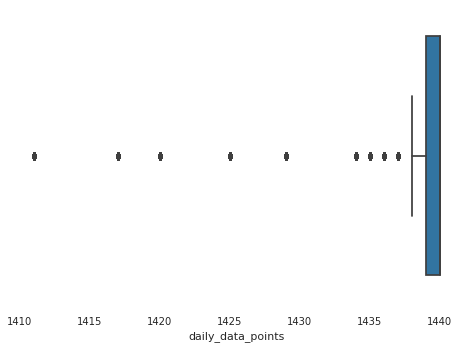

In [32]:
sns.boxplot(x=autolib['daily_data_points'])

In [33]:
autolib=autolib[autolib['daily_data_points']>=1400]

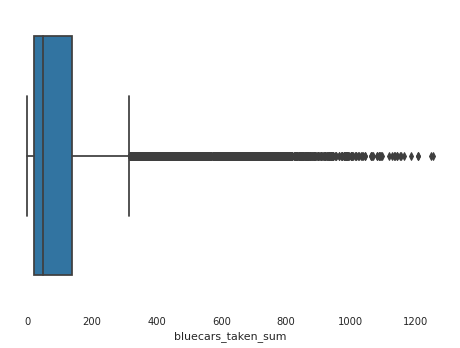

In [34]:
sns.boxplot(x=autolib['bluecars_taken_sum'])

In [35]:
autolib=autolib[autolib['bluecars_taken_sum']<=1300]

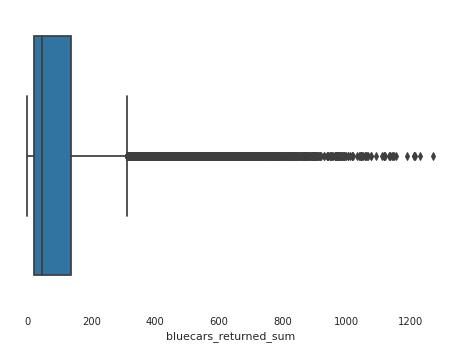

In [36]:
sns.boxplot(x=autolib['bluecars_returned_sum'])

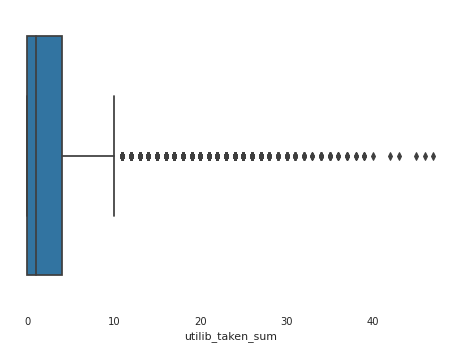

In [37]:
sns.boxplot(x=autolib['utilib_taken_sum'])

In [38]:
autolib=autolib[autolib['utilib_taken_sum']<=50]

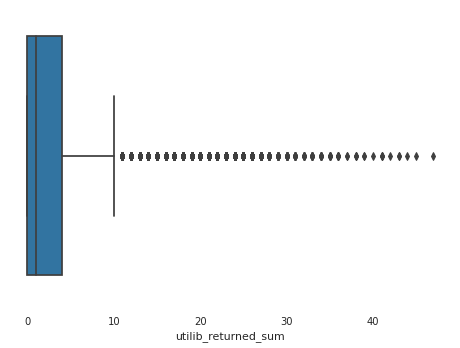

In [39]:
sns.boxplot(x=autolib['utilib_returned_sum'])

In [40]:
autolib=autolib[autolib['utilib_returned_sum']<=50]

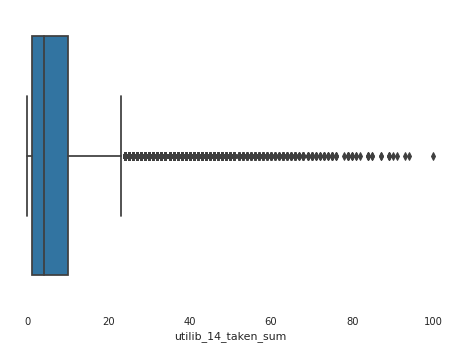

In [41]:
sns.boxplot(x=autolib['utilib_14_taken_sum'])

In [42]:
autolib=autolib[autolib['utilib_14_taken_sum']<=100]

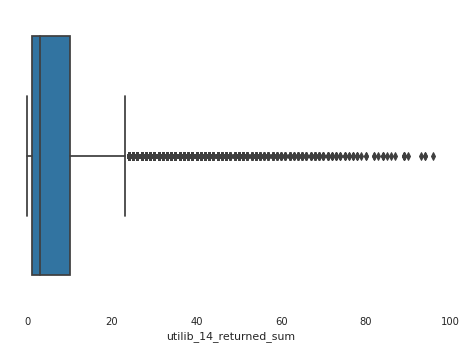

In [43]:
sns.boxplot(x=autolib['utilib_14_returned_sum'])

In [44]:
autolib=autolib[autolib['utilib_14_returned_sum']<=100]

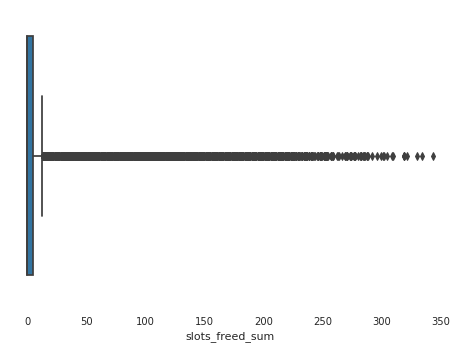

In [45]:
sns.boxplot(x=autolib['slots_freed_sum'])

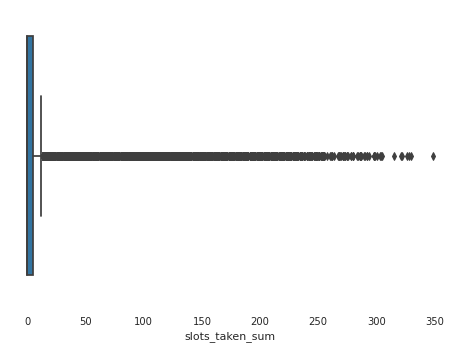

In [46]:
sns.boxplot(x=autolib['slots_taken_sum'])

In [47]:
autolib=autolib[autolib['slots_taken_sum']<=350]

As observed from the boxplots, the dataset has heavy outliers in almost every column. Removing all the outliers from the columns would result in a great loss of data.
In some columns, there are extreme instances of outliers.Therefore removing these outliers would aid in the accuracy of our findings

Despite removing the extreme outliers, the kurtosis is expected to be higher than that of the normal distribution

## Exploratory Data Analysis Report 

Here I apply the pandas profiling from pandas-profiling library library
for univariate and bivaraite analysis

In [ ]:
# installing and importing from pandas profiling
!pip install pandas-profiling==2.7.1
import pandas_profiling


In [49]:
report = pandas_profiling.ProfileReport(df=autolib)
report

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### The following are some of the observations made
* There are 14 columns: 1 column has categorical data, 12 have numeric data and a date column
* A point to note is that the distributions for the numerical data is positively skewed; mean is greater than the mode and thus the outliers are spread to the right
* The following variables are correlated with each other:
   * bluecars_returned_sum is highly correlated with bluecars_taken_sum and (utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum)
   * utilib_returned_sum is highly correlated with utilib_taken_sum

* To note,the days when the carsharing service is on demand (given by order) is Monday, Tuesday then followed by Sunday. whereas the least traffic days are on Thursday followed by Saturday

## Sampling


First and foremost, our period of interest is on the weekends, therefore 
we focus on the entries on weekends.
The sampling approach to adapt would be using Stratified Random Sampling method.
We then sample with regard to the day of the week(5 for Saturday and 6 for Sunday).the two days form the strata for the data 

In [50]:
weekend =autolib[autolib['day_type']=='weekend']
weekend

,postal_code,date,daily_data_points,day_of_week,day_type,bluecars_taken_sum,bluecars_returned_sum,utilib_taken_sum,utilib_returned_sum,utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum
5,75001,2018-01-06,1437,5,weekend,187,185,6,6,7,8,38,35
6,75001,2018-01-07,1440,6,weekend,180,180,2,2,10,9,34,34
12,75001,2018-01-13,1440,5,weekend,224,223,2,2,15,15,38,38
13,75001,2018-01-14,1440,6,weekend,193,193,2,2,12,12,22,20
19,75001,2018-01-20,1439,5,weekend,217,217,2,2,25,25,41,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...
16068,95880,2018-06-03,1440,6,weekend,36,33,1,1,2,2,0,0
16074,95880,2018-06-09,1440,5,weekend,15,15,0,0,1,2,0,0
16075,95880,2018-06-10,1440,6,weekend,34,32,0,0,1,0,0,0
16081,95880,2018-06-16,1440,5,weekend,19,19,0,0,2,1,0,0


In [51]:
weekend['day_of_week'].value_counts()

6    2169
5    2061
Name: day_of_week, dtype: int64

In [52]:
# Stratified sample
strat_weekend = weekend.groupby('day_of_week', group_keys=False).apply(lambda grouped_subset : grouped_subset.sample(frac=0.1))

# proportion of the non_stratified sample
print(strat_weekend['day_of_week'].value_counts())

# Check the stratified output
strat_weekend


6    217
5    206
Name: day_of_week, dtype: int64


,postal_code,date,daily_data_points,day_of_week,day_type,bluecars_taken_sum,bluecars_returned_sum,utilib_taken_sum,utilib_returned_sum,utilib_14_taken_sum,utilib_14_returned_sum,slots_freed_sum,slots_taken_sum
13513,94120,2018-03-24,1440,5,weekend,54,53,0,1,2,3,0,0
2529,75017,2018-02-03,1438,5,weekend,981,963,30,30,60,61,251,255
6114,92210,2018-02-03,1438,5,weekend,119,126,5,5,5,4,4,4
11435,93310,2018-04-14,1440,5,weekend,17,18,2,2,1,1,0,0
13735,94130,2018-06-09,1440,5,weekend,53,50,4,3,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7689,92320,2018-02-18,1438,6,weekend,82,91,1,3,10,11,0,0
12565,93600,2018-03-11,1440,6,weekend,18,12,1,0,0,0,0,0
12519,93600,2018-01-21,1440,6,weekend,28,25,4,4,2,1,0,0
8415,92370,2018-01-07,1440,6,weekend,52,43,1,1,1,1,0,0


The sample size is 423 given that the fraction of axis items to return is 0.1 which supports the ratio of day of week 5 (saturday) to day of week 6 (sunday)

# Hypothesis testing

Ho:There is no significant difference in the number of blue cars returned on Saturday and Sunday

H1: There is a significant difference in the number of blue cars returned on Saturday than on Sunday

This is represented by:

Ho:μ1-μ2=0

vs.

H1:μ1-μ2< 0 


#### calculating the means for the samples of Saturday and Sunday respectively

In [53]:
meanA =strat_weekend[strat_weekend['day_of_week']==5]['bluecars_returned_sum'].mean()
meanA

155.36893203883494

In [54]:
meanB=strat_weekend[strat_weekend['day_of_week']==6]['bluecars_returned_sum'].mean()
meanB

146.76036866359448

#### calculating the population variances for Saturday and Sunday respectively

In [55]:
#population variance for Saturday

varianceA=(autolib[autolib['day_of_week']==5]['bluecars_returned_sum'].std())**2
varianceA

50378.832344087845

In [56]:
#population variance for Sunday
varianceB=(autolib[autolib['day_of_week']==6]['bluecars_returned_sum'].std())**2
varianceB

44982.485978625285

#### calculating the sample sizes for Saturday and Sunday respectively 

In [57]:
#sample size for bluecars returned on Saturday
nA=strat_weekend[strat_weekend['day_of_week']==5].shape[0]
nA

206

In [58]:
#sample size for bluecars returned on Sunday
nB=strat_weekend[strat_weekend['day_of_week']==6].shape[0]
nB

217

#### we set our level of significance at α=0.05 

therefore the critical values =  +/-1.96




## calculating the test statistic

since we have a known variance and our sample are independent, then we use a z- test

In [59]:
zscore= ((meanA-meanB)-0)/((varianceA/nA)+(varianceB/nB))**0.5
zscore

0.4049799639700805

using an online [calculator](https://www.socscistatistics.com/pvalues/normaldistribution.aspx) :

the p-value is found to be -0.342776


#### Decision
since zscore > critical_value_α , ie,  0.4049 > -1.6449 we fail to reject the null hypothesis Ho

#### Conclusion

At the α = 0.05 level of significance, there is not enough evidence to
conclude that there is a significant difference in the number of blue cars returned on Saturday than on Sunday.

####point estimate

In [60]:
#point estimatefor mean for saturday
mean_saturday =strat_weekend[strat_weekend['day_of_week']==5]['bluecars_returned_sum'].mean()
print(mean_saturday)
mean_saturday_pop =autolib[autolib['day_of_week']==5]['bluecars_returned_sum'].mean()
print(mean_saturday_pop)
print(mean_saturday-mean_saturday_pop)

155.36893203883494
158.7976710334789
-3.4287389946439646


In [61]:
#point estimatefor mean for sanday
mean_sunday =strat_weekend[strat_weekend['day_of_week']==6]['bluecars_returned_sum'].mean()
print(mean_sunday)
mean_sunday_pop =autolib[autolib['day_of_week']==6]['bluecars_returned_sum'].mean()
print(mean_sunday_pop)
print(mean_sunday-mean_sunday_pop)

146.76036866359448
148.149377593361
-1.3890089297665327


point estimators dont produce accurate results dueto the distributions being highly skewed

####confidence intervals

In [62]:
#confidence interval for saturday sample
std_sample_sat  = autolib[autolib['day_of_week']==5]['bluecars_returned_sum'].std()

std_error = std_sample_sat / np.sqrt(nA)
std_error

# Calculating the 95% Confidence Interval for mean data 

# 
stats.norm.interval(0.95, loc=mean_saturday, scale=std_error)

(124.71836386243328, 186.0195002152366)

In [63]:
#confidence interval for sunday sample
std_sample_sun  = autolib[autolib['day_of_week']==5]['bluecars_returned_sum'].std()

std_error = std_sample_sat / np.sqrt(nB)
std_error

# Calculating the 95% Confidence Interval for mean data 

# 
stats.norm.interval(0.95, loc=mean_sunday, scale=std_error)

(116.8967609011018, 176.62397642608715)